## Kod do badania użyteczności rozkładu intensywności kolorów rgb jako cech dla modelu

### Sprawdzono skuteczność prostego modelu w zależności od ilości binów, w praktyce nie warto brać więcej niż kwartyli (zespół testowy sprawdziły accuracy dla podziału na od 3 do 100 binów)

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random
import seaborn as sns
import hashlib
from collections import defaultdict

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

In [2]:
colors = [
    "#E6194B",  # Intensywny czerwony
    "#3CB44B",  # Jasny zielony
    "#FFE119",  # Żółty
    "#0082C8",  # Niebieski
    "#F58231",  # Pomarańczowy
    "#911EB4",  # Fioletowy
    "#46F0F0",  # Turkusowy
    "#F032E6",  # Magenta / różowy
    "#D2F53C",  # Limonkowy
    "#FABEBE",  # Jasnoczerwony / różowawy
    "#008080",  # Morski / ciemnoturkusowy
    "#E6BEFF",  # Jasny fiolet / lawenda
]

In [3]:
data_path="../Dataset_split/train"

In [4]:
categories=os.listdir(data_path)
for category in categories:
    category_path = os.path.join(data_path, category)
    if os.path.isdir(category_path):
        print(f"{category}: {len(os.listdir(category_path))} images")

Bombali Ghevda: 128 images
Butka Ghevda: 128 images
Gabara Ghevda: 128 images
God Wal: 128 images
Hirva Lamb: 128 images
Kadu wal: 126 images
Kala Wal: 128 images
Lal lamb shenga: 128 images
Lamb Shiracha Ghevda: 128 images
Shravan Ghevda: 126 images
Tambda wal: 128 images
Vatana Ghevda: 128 images


In [5]:
data = []
for class_folder in os.listdir(data_path):  
    class_path = os.path.join(data_path, class_folder)
    if os.path.isdir(class_path):  
        for file in os.listdir(class_path):  
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):  
                data.append({"class": class_folder, "filename": file, "path": os.path.join(class_path, file)})


df = pd.DataFrame(data)

In [6]:
print(df.head())

            class     filename  \
0  Bombali Ghevda        1.jpg   
1  Bombali Ghevda       10.jpg   
2  Bombali Ghevda  10_aug0.jpg   
3  Bombali Ghevda       11.jpg   
4  Bombali Ghevda  11_aug0.jpg   

                                                path  
0        ../Dataset_split/train\Bombali Ghevda\1.jpg  
1       ../Dataset_split/train\Bombali Ghevda\10.jpg  
2  ../Dataset_split/train\Bombali Ghevda\10_aug0.jpg  
3       ../Dataset_split/train\Bombali Ghevda\11.jpg  
4  ../Dataset_split/train\Bombali Ghevda\11_aug0.jpg  


In [7]:
def quartiles_color_without_white_and_black(img_path):
    """Oblicza kwartyle kolorów RGB dla obrazu, ignorując piksele poniżej (3,3,3) i powyżej (250,250,250)."""
    with Image.open(img_path) as img:
        img = img.convert("RGB")  
        img = img.resize((100, 70))  
        img_array = np.array(img)

        # Tworzymy maskę dla pikseli, które nie są białe ani czarne
        mask = np.all(img_array >= [3, 3, 3], axis=2) & np.all(img_array <= [250, 250, 250], axis=2)
        valid_pixels = img_array[mask]

        if len(valid_pixels) == 0:  
            return np.array([0, 0, 0, 0, 0, 0, 0, 0, 0])  # Zwracamy zera, jeśli nie ma żadnych ważnych pikseli

        # Obliczamy kwartyle dla każdego kanału RGB
        q1 = np.percentile(valid_pixels[:, 0], 25)  # 25th percentile dla R
        median = np.percentile(valid_pixels[:, 0], 50)  # 50th percentile (mediana) dla R
        q3 = np.percentile(valid_pixels[:, 0], 75)  # 75th percentile dla R

        q1_g = np.percentile(valid_pixels[:, 1], 25)  # 25th percentile dla G
        median_g = np.percentile(valid_pixels[:, 1], 50)  # 50th percentile (mediana) dla G
        q3_g = np.percentile(valid_pixels[:, 1], 75)  # 75th percentile dla G

        q1_b = np.percentile(valid_pixels[:, 2], 25)  # 25th percentile dla B
        median_b = np.percentile(valid_pixels[:, 2], 50)  # 50th percentile (mediana) dla B
        q3_b = np.percentile(valid_pixels[:, 2], 75)  # 75th percentile dla B

        return np.array([q1, median, q3, q1_g, median_g, q3_g, q1_b, median_b, q3_b])



In [8]:
# Zastosowanie funkcji do DataFrame
df[["Q1_R", "Median_R", "Q3_R", "Q1_G", "Median_G", "Q3_G", "Q1_B", "Median_B", "Q3_B"]] = df["path"].apply(lambda x: pd.Series(quartiles_color_without_white_and_black(x)))

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


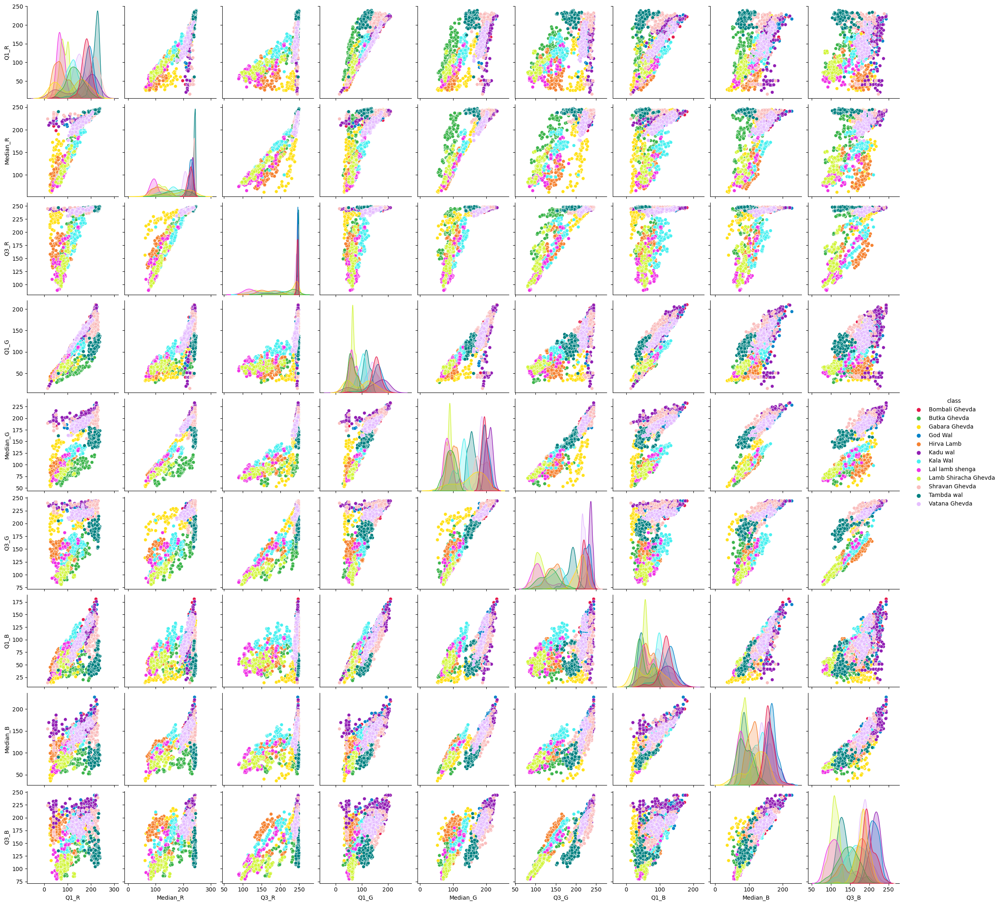

In [9]:
sns.pairplot(df, hue="class", diag_kind="kde", palette=colors)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


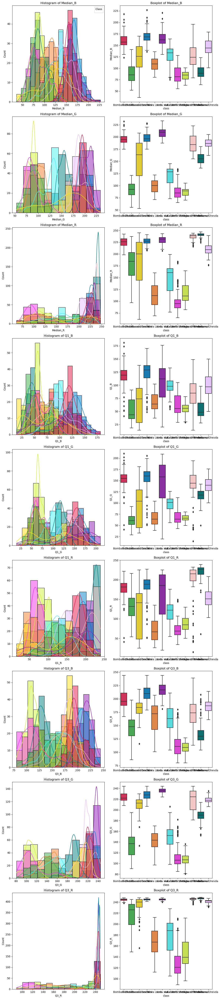

In [10]:
# Wykresy dla wszystkich cech, z wyjątkiem 'class', 'path' i 'filename'
features = df.columns.difference(['class', 'path', 'filename'])

# Ustawienie układu wykresów: 1 wiersz, 2 kolumny
fig, axes = plt.subplots(len(features), 2, figsize=(12, 6 * len(features)))

# Flag do zarządzania legendą
legend_added = False

for i, feature in enumerate(features):
    # Histogram z rozróżnieniem 'class' i niestandardową paletą
    sns.histplot(data=df, x=feature, hue="class", kde=True, ax=axes[i, 0], palette=colors, legend=not legend_added)
    axes[i, 0].set_title(f"Histogram of {feature}")
    
    # Boxplot z rozróżnieniem 'class' i niestandardową paletą
    sns.boxplot(x="class", y=feature, data=df, ax=axes[i, 1], palette=colors)
    axes[i, 1].set_title(f"Boxplot of {feature}")
    
    # Dodanie legendy tylko na pierwszym wykresie (histogramie)
    if not legend_added:
        axes[i, 0].legend(title="Class")
        legend_added = True

# Dostosowanie układu
plt.tight_layout()
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_13596\330986475.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


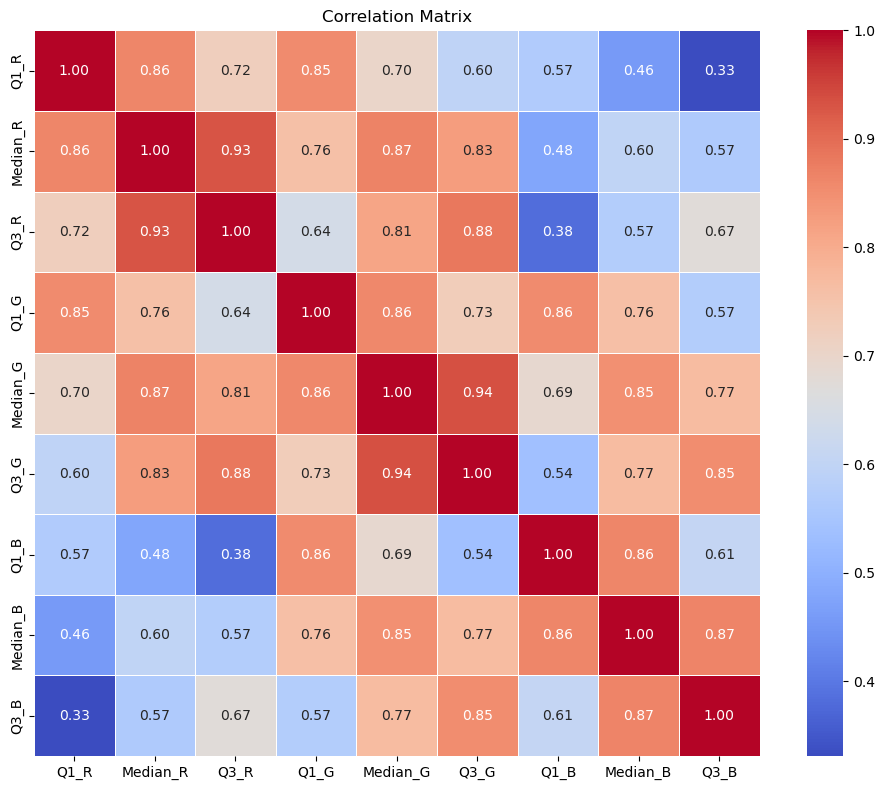

In [11]:
# Obliczamy macierz korelacji dla wszystkich cech numerycznych w df
corr_matrix = df.corr()

# Ustawiamy wykres
plt.figure(figsize=(10, 8))

# Tworzymy mapę cieplną z macierzy korelacji
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True, linewidths=0.5)

# Tytuł wykresu
plt.title("Correlation Matrix")

# Wyświetlamy wykres
plt.tight_layout()
plt.show()

In [12]:
data = pd.DataFrame(df)
data.head()

,class,filename,path,Q1_R,Median_R,Q3_R,Q1_G,Median_G,Q3_G,Q1_B,Median_B,Q3_B
0,Bombali Ghevda,1.jpg,../Dataset_split/train\Bombali Ghevda\1.jpg,196.75,221.0,241.0,181.00,204.0,228.0,147.00,178.0,213.0
1,Bombali Ghevda,10.jpg,../Dataset_split/train\Bombali Ghevda\10.jpg,174.00,217.0,243.0,154.00,197.0,222.0,119.00,154.0,190.0
2,Bombali Ghevda,10_aug0.jpg,../Dataset_split/train\Bombali Ghevda\10_aug0.jpg,167.00,219.0,244.0,146.00,195.0,228.0,112.50,159.0,195.5
3,Bombali Ghevda,11.jpg,../Dataset_split/train\Bombali Ghevda\11.jpg,176.00,220.0,244.0,155.00,198.0,225.0,119.00,155.5,195.0
4,Bombali Ghevda,11_aug0.jpg,../Dataset_split/train\Bombali Ghevda\11_aug0.jpg,157.00,216.0,243.0,138.75,193.0,222.0,107.75,153.0,187.0


In [13]:
y = data['class']  # Kolumna z etykietami
X = data.drop(['class',"path","filename"], axis=1)  # Wszystkie inne cechy

# Konwersja wartości tekstowych na numeryczne
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Podział na zbiór treningowy, walidacyjny i testowy
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, stratify=y_encoded, test_size=0.3, random_state=42
)

X_val, X_test, y_val, y_test = train_test_split(
    X_val, y_val, stratify=y_val, test_size=0.3, random_state=42
)

In [14]:
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [15]:
y_pred = clf.predict(X_test)

# Ocena modelu
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=label_encoder.classes_)

print(f"Dokładność modelu: {accuracy:.4f}")
print("Raport klasyfikacji:\n", report)

Dokładność modelu: 0.8551
Raport klasyfikacji:
                       precision    recall  f1-score   support

      Bombali Ghevda       0.43      0.27      0.33        11
        Butka Ghevda       1.00      0.91      0.95        11
       Gabara Ghevda       0.92      1.00      0.96        11
             God Wal       0.64      0.75      0.69        12
          Hirva Lamb       1.00      0.92      0.96        12
            Kadu wal       0.77      0.83      0.80        12
            Kala Wal       0.92      1.00      0.96        11
     Lal lamb shenga       0.92      0.92      0.92        12
Lamb Shiracha Ghevda       0.92      1.00      0.96        11
      Shravan Ghevda       1.00      0.92      0.96        12
          Tambda wal       1.00      1.00      1.00        11
       Vatana Ghevda       0.69      0.75      0.72        12

            accuracy                           0.86       138
           macro avg       0.85      0.86      0.85       138
        weighted avg

In [16]:
import pandas as pd
import numpy as np
from PIL import Image

def calculate_rgb_distribution(df, path_column, n=10):
    results = []

    # Tworzenie nazw kolumn dla przedziałów RGB
    bin_labels = [f"r_bin_{i}" for i in range(n)] + \
                 [f"g_bin_{i}" for i in range(n)] + \
                 [f"b_bin_{i}" for i in range(n)]

    for path in df[path_column]:
        try:
            # Otwórz obraz i konwertuj do RGB
            image = Image.open(path).convert('RGB')
            img_array = np.array(image)
            
            # Spłaszcz tablicę do kształtu (num_pixels, 3)
            pixels = img_array.reshape(-1, 3)
            
            # Oblicz jasność jako średnia z R, G, B
            brightness = pixels.mean(axis=1)
            
            # Filtrowanie pikseli według jasności
            valid_pixels = pixels[(brightness >= 3) & (brightness <= 250)]
            
            if len(valid_pixels) == 0:
                results.append([path] + [0] * (3 * n))
                continue
            
            # Oblicz histogramy dla R, G, B
            hist_r, _ = np.histogram(valid_pixels[:, 0], bins=n, range=(0, 255))
            hist_g, _ = np.histogram(valid_pixels[:, 1], bins=n, range=(0, 255))
            hist_b, _ = np.histogram(valid_pixels[:, 2], bins=n, range=(0, 255))

            # Normalizacja do procentowego rozkładu
            total_pixels = valid_pixels.shape[0]
            hist_r = (hist_r / total_pixels).tolist()
            hist_g = (hist_g / total_pixels).tolist()
            hist_b = (hist_b / total_pixels).tolist()

            results.append([path] + hist_r + hist_g + hist_b)

        except Exception as e:
            print(f"Error processing {path}: {e}")
            results.append([path] + [0] * (3 * n))

    # Tworzenie DataFrame z wynikami
    columns = [path_column] + bin_labels
    result_df = pd.DataFrame(results, columns=columns)
    
    return result_df


result_df = calculate_rgb_distribution(df, 'path', n=5)
print(result_df)



                                                   path   r_bin_0   r_bin_1  \
0           ../Dataset_split/train\Bombali Ghevda\1.jpg  0.000000  0.000000   
1          ../Dataset_split/train\Bombali Ghevda\10.jpg  0.000000  0.004484   
2     ../Dataset_split/train\Bombali Ghevda\10_aug0.jpg  0.040070  0.010017   
3          ../Dataset_split/train\Bombali Ghevda\11.jpg  0.000000  0.006116   
4     ../Dataset_split/train\Bombali Ghevda\11_aug0.jpg  0.042789  0.007924   
...                                                 ...       ...       ...   
1527        ../Dataset_split/train\Vatana Ghevda\80.jpg  0.000000  0.000000   
1528   ../Dataset_split/train\Vatana Ghevda\80_aug0.jpg  0.046142  0.010212   
1529    ../Dataset_split/train\Vatana Ghevda\8_aug0.jpg  0.052262  0.055336   
1530         ../Dataset_split/train\Vatana Ghevda\9.jpg  0.007292  0.047396   
1531    ../Dataset_split/train\Vatana Ghevda\9_aug0.jpg  0.011066  0.058650   

       r_bin_2   r_bin_3   r_bin_4   g_bin_0   g_bi

In [17]:
import re
def extract_class(df, path_column):
    df['class'] = df[path_column].apply(lambda x: re.search(r'[/\\]([^/\\]+)[/\\][^/\\]+$', x).group(1) if re.search(r'[/\\]([^/\\]+)[/\\][^/\\]+$', x) else None)
    return df


result_df = extract_class(result_df, 'path')
print(result_df)

                                                   path   r_bin_0   r_bin_1  \
0           ../Dataset_split/train\Bombali Ghevda\1.jpg  0.000000  0.000000   
1          ../Dataset_split/train\Bombali Ghevda\10.jpg  0.000000  0.004484   
2     ../Dataset_split/train\Bombali Ghevda\10_aug0.jpg  0.040070  0.010017   
3          ../Dataset_split/train\Bombali Ghevda\11.jpg  0.000000  0.006116   
4     ../Dataset_split/train\Bombali Ghevda\11_aug0.jpg  0.042789  0.007924   
...                                                 ...       ...       ...   
1527        ../Dataset_split/train\Vatana Ghevda\80.jpg  0.000000  0.000000   
1528   ../Dataset_split/train\Vatana Ghevda\80_aug0.jpg  0.046142  0.010212   
1529    ../Dataset_split/train\Vatana Ghevda\8_aug0.jpg  0.052262  0.055336   
1530         ../Dataset_split/train\Vatana Ghevda\9.jpg  0.007292  0.047396   
1531    ../Dataset_split/train\Vatana Ghevda\9_aug0.jpg  0.011066  0.058650   

       r_bin_2   r_bin_3   r_bin_4   g_bin_0   g_bi

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


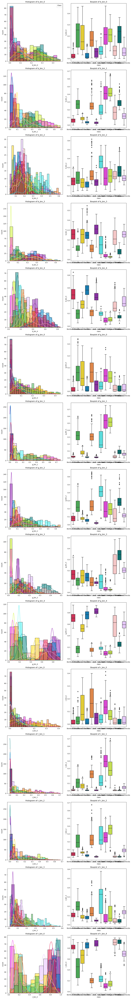

In [18]:
# Wykresy dla wszystkich cech, z wyjątkiem 'class', 'path' i 'filename'
features = result_df.columns.difference(['class', 'path'])

# Ustawienie układu wykresów: 1 wiersz, 2 kolumny
fig, axes = plt.subplots(len(features), 2, figsize=(12, 6 * len(features)))

# Flag do zarządzania legendą
legend_added = False

for i, feature in enumerate(features):
    # Histogram z rozróżnieniem 'class' i niestandardową paletą
    sns.histplot(data=result_df, x=feature, hue="class", kde=True, ax=axes[i, 0], palette=colors, legend=not legend_added)
    axes[i, 0].set_title(f"Histogram of {feature}")
    
    # Boxplot z rozróżnieniem 'class' i niestandardową paletą
    sns.boxplot(x="class", y=feature, data=result_df, ax=axes[i, 1], palette=colors)
    axes[i, 1].set_title(f"Boxplot of {feature}")
    
    # Dodanie legendy tylko na pierwszym wykresie (histogramie)
    if not legend_added:
        axes[i, 0].legend(title="Class")
        legend_added = True

# Dostosowanie układu
plt.tight_layout()
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_13596\3780128576.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = result_df.corr()


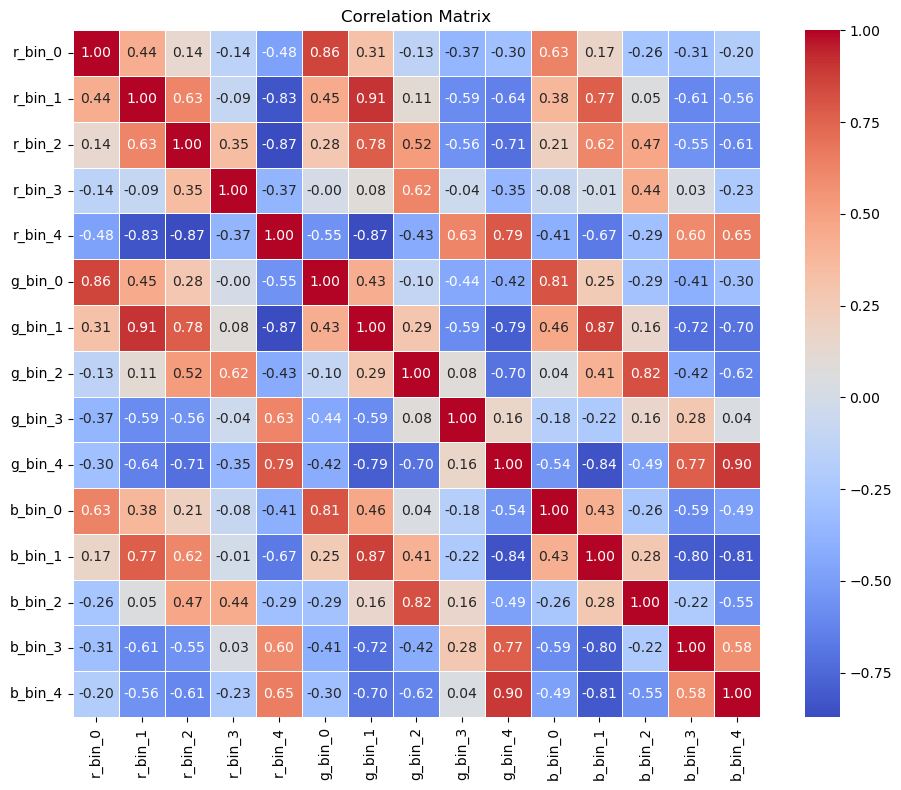

In [19]:
# Obliczamy macierz korelacji dla wszystkich cech numerycznych w df
corr_matrix = result_df.corr()

# Ustawiamy wykres
plt.figure(figsize=(10, 8))

# Tworzymy mapę cieplną z macierzy korelacji
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True, linewidths=0.5)

# Tytuł wykresu
plt.title("Correlation Matrix")

# Wyświetlamy wykres
plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


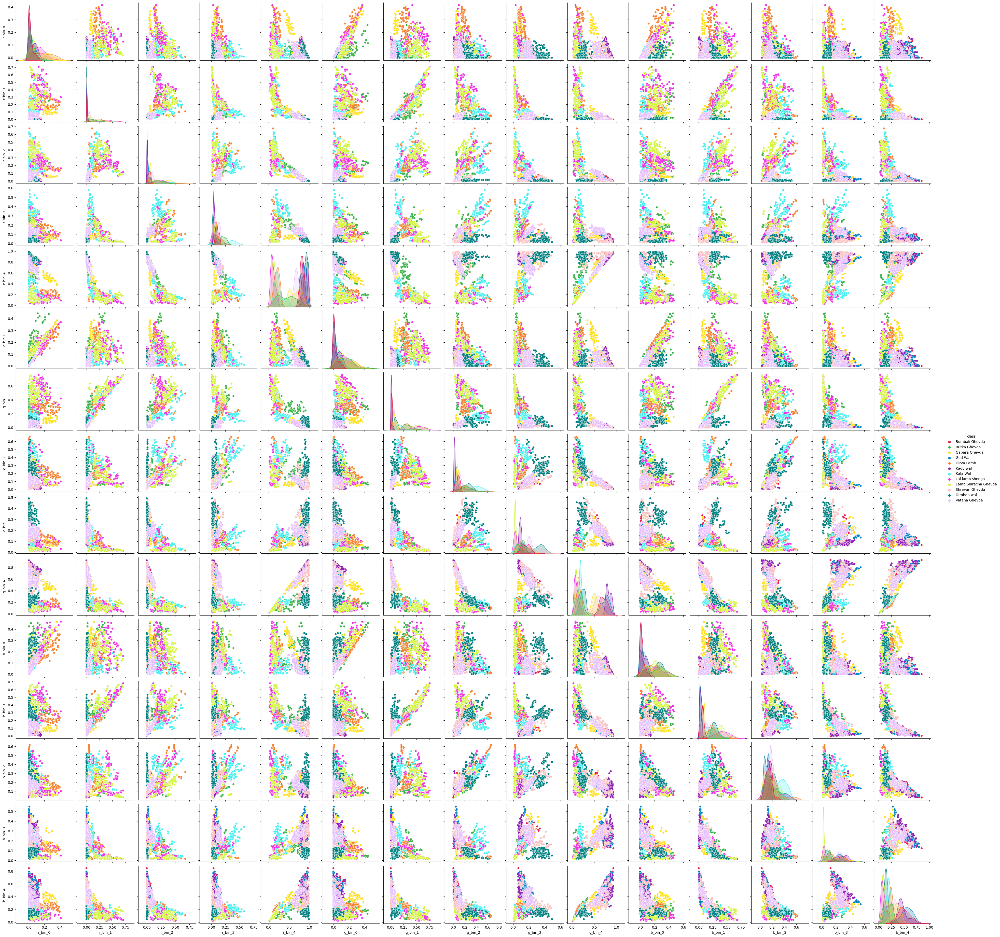

In [20]:
sns.pairplot(result_df, hue="class", diag_kind="kde", palette=colors)
plt.show()

In [21]:
data = pd.DataFrame(result_df)
y = data['class']  # Kolumna z etykietami
X = data.drop(['class',"path",], axis=1)  # Wszystkie inne cechy

# Konwersja wartości tekstowych na numeryczne
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Podział na zbiór treningowy, walidacyjny i testowy
X_train, X_val, y_train, y_val = train_test_split(
    X, y_encoded, stratify=y_encoded, test_size=0.3, random_state=42
)

X_val, X_test, y_val, y_test = train_test_split(
    X_val, y_val, stratify=y_val, test_size=0.3, random_state=42
)

In [23]:
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_val)

# Ocena modelu
accuracy = accuracy_score(y_val, y_pred)
report = classification_report(y_val, y_pred, target_names=label_encoder.classes_)

print(f"liczba badanych binów: {n:.4f}")
print(f"Dokładność modelu: {accuracy:.4f}")
print("Raport klasyfikacji:\n", report)

NameError: name 'n' is not defined

In [ ]:
def process_and_train_model(data_path, n_bins=10, report_filename="classification_report.txt"):
    # Tworzenie listy plików i klas
    data = []
    for class_folder in os.listdir(data_path):  
        class_path = os.path.join(data_path, class_folder)
        if os.path.isdir(class_path):  
            for file in os.listdir(class_path):  
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):  
                    data.append({"class": class_folder, "filename": file, "path": os.path.join(class_path, file)})

    df = pd.DataFrame(data)

    # Funkcja do obliczania rozkładu RGB
    def calculate_rgb_distribution(df, path_column, n):
        results = []
        bin_labels = [f"r_bin_{i}" for i in range(n)] + \
                     [f"g_bin_{i}" for i in range(n)] + \
                     [f"b_bin_{i}" for i in range(n)]

        for path in df[path_column]:
            try:
                image = Image.open(path).convert('RGB')
                img_array = np.array(image)
                pixels = img_array.reshape(-1, 3)
                brightness = pixels.mean(axis=1)
                valid_pixels = pixels[(brightness >= 3) & (brightness <= 250)]
                
                if len(valid_pixels) == 0:
                    results.append([path] + [0] * (3 * n))
                    continue

                hist_r, _ = np.histogram(valid_pixels[:, 0], bins=n, range=(0, 255))
                hist_g, _ = np.histogram(valid_pixels[:, 1], bins=n, range=(0, 255))
                hist_b, _ = np.histogram(valid_pixels[:, 2], bins=n, range=(0, 255))

                total_pixels = valid_pixels.shape[0]
                hist_r = (hist_r / total_pixels).tolist()
                hist_g = (hist_g / total_pixels).tolist()
                hist_b = (hist_b / total_pixels).tolist()

                results.append([path] + hist_r + hist_g + hist_b)

            except Exception as e:
                print(f"Error processing {path}: {e}")
                results.append([path] + [0] * (3 * n))

        columns = [path_column] + bin_labels
        return pd.DataFrame(results, columns=columns)

    # Oblicz histogramy RGB
    result_df = calculate_rgb_distribution(df, 'path', n_bins)
    df = df.merge(result_df, on='path')

    # Przygotowanie danych do klasyfikacji
    y = df['class']
    X = df.drop(['class', "path", "filename"], axis=1)

    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    # Podział na zbiory treningowy, walidacyjny i testowy
    X_train, X_val, y_train, y_val = train_test_split(X, y_encoded, stratify=y_encoded, test_size=0.3, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, stratify=y_val, test_size=0.3, random_state=42)

    # Trening modelu
    clf = RandomForestClassifier(n_estimators=100, random_state=42)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val)

    # Ocena modelu
    accuracy = accuracy_score(y_val, y_pred)
    report = classification_report(y_val, y_pred, target_names=label_encoder.classes_)

    
    
    # Zapis wyników do pliku
    with open(report_filename, "a", encoding="utf-8") as f:
        f.write(f"Liczba badanych binów: {n_bins}\n")
        f.write(f"Dokładność modelu: {accuracy:.4f}\n\n")
        f.write("Raport klasyfikacji:\n")
        f.write(report)

    print(f"Raport zapisano do {report_filename}")

In [ ]:
for n in range(1,5):
    process_and_train_model(data_path, n_bins=n, report_filename="classification_report.txt")
